In [1]:
import tensorflow as tf
from tensorflow.keras.applications.resnet50 import preprocess_input
from tensorflow.keras.preprocessing.image import img_to_array
from tensorflow.keras.preprocessing.image import load_img

import tensorflow_datasets as tfds 

import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split
import matplotlib.image as mpimg
import matplotlib.pyplot as plt

import json
from glob import glob
from PIL import Image
import pickle
import re
import os
import time, datetime

from tqdm import tqdm

In [2]:
####### GPU CONFIGS FOR RTX 2070 ###############
## Please ignore if not training on GPU       ##
## this is important for running CuDNN on GPU ##

tf.keras.backend.clear_session() #- for easy reset of notebook state

# chck if GPU can be seen by TF
tf.config.list_physical_devices('GPU')
#tf.debugging.set_log_device_placement(True)  # only to check GPU usage
gpus = tf.config.experimental.list_physical_devices('GPU')
if gpus:
  # Restrict TensorFlow to only use the first GPU
  try:
    tf.config.experimental.set_memory_growth(gpus[0], True)
    tf.config.experimental.set_visible_devices(gpus[0], 'GPU')
    logical_gpus = tf.config.experimental.list_logical_devices('GPU')
    print(len(gpus), "Physical GPUs,", len(logical_gpus), "Logical GPU")
  except RuntimeError as e:
    # Visible devices must be set before GPUs have been initialized
    print(e)
###############################################

1 Physical GPUs, 1 Logical GPU


# Prepare Data
(pull in data download and construction of `data.csv` from other notebook)

In [3]:
prefix = './pretrain/'
save_prefix = prefix + "features/"  # for storing prefixes
annot = prefix + 'data.csv'

In [4]:
inputs = pd.read_csv(annot, header=None, names=["caption", "image"])

In [5]:
inputs.describe()

,caption,image
count,515441,515441
unique,497607,103035
top,A man riding a wave on top of a surfboard.,./pretrain/train2014/COCO_train2014_0000000521...
freq,136,7


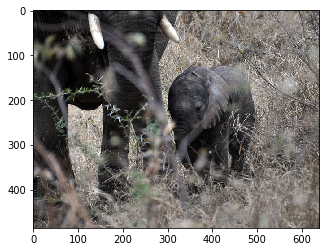

In [7]:
# display some random images and captions
img = mpimg.imread(inputs.image[1])
imgplot = plt.imshow(img)

[[<matplotlib.axes._subplots.AxesSubplot object at 0x7f4cd4290390>
./pretrain/train2014/COCO_train2014_000000364385.jpg
./pretrain/train2014/COCO_train2014_000000157497.jpg
./pretrain/train2014/COCO_train2014_000000323722.jpg
./pretrain/train2014/COCO_train2014_000000478648.jpg


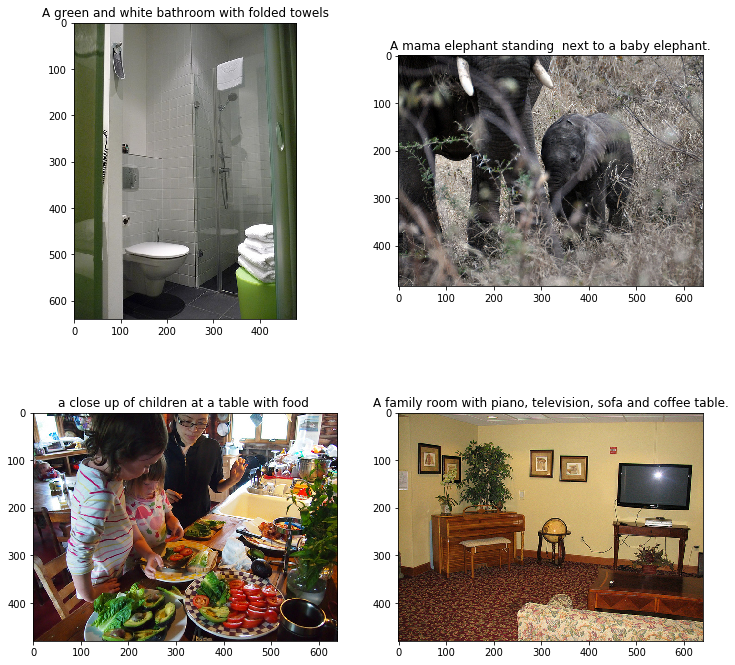

In [20]:
f, axarr = plt.subplots(2,2, figsize=(12, 12))
print(axarr)
axs = axarr.flatten()
for ax, cap, im in zip(axs, inputs.caption[:4], inputs.image[:4]):
    # Iterating over the grid returns the Axes.
    print(im)
    img = mpimg.imread(im)
    ax.imshow(img)
    ax.set_title(cap)

plt.show()

## Extract Features from Images
Note that this section does not need to re-run if it has been run once.


In [6]:
# We are going to use the last residual block of the ResNet50 architecture
# which has dimension 7x7x2048 and store into individual file

In [7]:
def load_image(image_path, size=(224, 224)):    
    image = tf.io.read_file(image_path)
    image = tf.io.decode_jpeg(image, channels=3)
    image = tf.image.resize(image, size)
    image = preprocess_input(image) #ResNet50
    return image, image_path

In [8]:
uniq_images = sorted(inputs['image'].unique())

In [9]:
len(uniq_images)

103035

In [10]:
#tf.keras.backend.clear_session()

In [11]:
image_dataset = tf.data.Dataset.from_tensor_slices(uniq_images)
image_dataset = image_dataset.map(
  load_image, num_parallel_calls=tf.data.experimental.AUTOTUNE).batch(16) 

In [12]:
rs50 = tf.keras.applications.ResNet50(
    include_top=False,
    weights="imagenet",  #no pooling
    input_shape=(224, 224, 3)
)

In [13]:
new_input = rs50.input
hidden_layer = rs50.layers[-1].output

features_extract = tf.keras.Model(new_input, hidden_layer)
features_extract.summary()

Model: "model"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, 224, 224, 3) 0                                            
__________________________________________________________________________________________________
conv1_pad (ZeroPadding2D)       (None, 230, 230, 3)  0           input_1[0][0]                    
__________________________________________________________________________________________________
conv1_conv (Conv2D)             (None, 112, 112, 64) 9472        conv1_pad[0][0]                  
__________________________________________________________________________________________________
conv1_bn (BatchNormalization)   (None, 112, 112, 64) 256         conv1_conv[0][0]                 
______________________________________________________________________________________________

conv4_block5_3_bn (BatchNormali (None, 14, 14, 1024) 4096        conv4_block5_3_conv[0][0]        
__________________________________________________________________________________________________
conv4_block5_add (Add)          (None, 14, 14, 1024) 0           conv4_block4_out[0][0]           
                                                                 conv4_block5_3_bn[0][0]          
__________________________________________________________________________________________________
conv4_block5_out (Activation)   (None, 14, 14, 1024) 0           conv4_block5_add[0][0]           
__________________________________________________________________________________________________
conv4_block6_1_conv (Conv2D)    (None, 14, 14, 256)  262400      conv4_block5_out[0][0]           
__________________________________________________________________________________________________
conv4_block6_1_bn (BatchNormali (None, 14, 14, 256)  1024        conv4_block6_1_conv[0][0]        
__________

In [14]:
save_prefix = prefix + "features/"
!mkdir {save_prefix}

mkdir: cannot create directory ‘./pretrain/features/’: File exists


In [15]:
for img, path in tqdm(image_dataset):
    batch_features = features_extract(img)
    batch_features = tf.reshape(batch_features,
                    (batch_features.shape[0], -1, batch_features.shape[3]))

    for feat, p in zip(batch_features, path):
        filepath = p.numpy().decode("utf-8")
        filepath = save_prefix + filepath.split('/')[-1][:-3] + "npy"
        np.save(filepath, feat.numpy())

6440it [09:03, 11.85it/s]


## Create a Subword Tokenizer and Prepare Captions

### Initialize SubWord Tokenizer
If you have already saved a tokenizer, then you don't have to re-run
these steps to build and save the tokenizer.

In [38]:
# ~8K vocab size
cap_tokenizer= tfds.features.text.SubwordTextEncoder.build_from_corpus(
        inputs['caption'].map(lambda x: x.lower().strip()).tolist(), 
        target_vocab_size=2**13, reserved_tokens=['<s>', '</s>'])

In [39]:
cap_tokenizer.vocab_size

8247

In [40]:
cap_tokenizer.save_to_file("captions")

### Run only the code below when Tokenizer has been previously saved

In [5]:
cap_tokenizer = tfds.features.text.SubwordTextEncoder.load_from_file("captions")

In [7]:
cap_tokenizer.encode("A man riding a wave on top of a surfboard.".lower())

[3, 11, 40, 3, 350, 4, 34, 5, 3, 401, 8037]

In [8]:
cap_tokenizer.decode([3, 11, 40, 3, 350, 4, 34, 5, 3, 401, 8037])

'a man riding a wave on top of a surfboard.'

In [9]:
# Max length of captions split by spaces
lens = inputs['caption'].map(lambda x: len(x.split()))
lens.describe()

count    515441.000000
mean         10.456628
std           2.391738
min           5.000000
25%           9.000000
50%          10.000000
75%          11.000000
max          49.000000
Name: caption, dtype: float64

In [10]:
lens.quantile(0.95)

15.0

In [11]:
# Max length of captions after tokenization
# tfds demonstrated in earlier chapters
# This is a quick way if data fits in memory
lens = inputs['caption'].map(lambda x: len(cap_tokenizer.encode(x.lower())))
lens.describe()

count    515441.000000
mean         11.642333
std           2.840649
min           7.000000
25%          10.000000
50%          11.000000
75%          13.000000
max          77.000000
Name: caption, dtype: float64

In [12]:
# We will set this as the max length of captions
# which cover 99% of the captions without truncation
lens.quantile(0.99)

21.0

In [13]:
#inputs = inputs.drop(columns=['tokenized', 'tokens'])

In [6]:
start = '<s>'
end = '</s>'
inputs['tokenized'] = inputs['caption'].map(lambda x: start+x.lower().strip()+end)
inputs.tokenized[:5]

0    <s>a green and white bathroom with folded towe...
1    <s>a mama elephant standing  next to a baby el...
2    <s>a close up of children at a table with food...
3    <s>a family room with piano, television, sofa ...
4    <s>a modern kitchen with all the trimmings and...
Name: tokenized, dtype: object

In [7]:
max_len = 22  # added one for start token
def tokenize_pad(x):
    x = cap_tokenizer.encode(x)
    if len(x) < max_len:
        x = x + [0] * (max_len - len(x))
    return x[:max_len]

inputs['tokens'] = inputs.tokenized.map(lambda x: tokenize_pad(x))

In [16]:
inputs.tokens.map(len).describe()

count    515441.0
mean         22.0
std           0.0
min          22.0
25%          22.0
50%          22.0
75%          22.0
max          22.0
Name: tokens, dtype: float64

In [17]:
cap_tokenizer.decode(inputs.tokens[1])

'<s>a mama elephant standing  next to a baby elephant.</s>'

In [18]:
inputs.head()

,caption,image,tokenized,tokens
0,A green and white bathroom with folded towels,./pretrain/train2014/COCO_train2014_0000003643...,<s>a green and white bathroom with folded towe...,"[1, 3, 63, 9, 22, 64, 8, 1987, 2333, 2, 0, 0, ..."
1,A mama elephant standing next to a baby eleph...,./pretrain/train2014/COCO_train2014_0000001574...,<s>a mama elephant standing next to a baby el...,"[1, 3, 5366, 138, 1694, 112, 21, 12, 3, 192, 5..."
2,a close up of children at a table with food,./pretrain/train2014/COCO_train2014_0000003237...,<s>a close up of children at a table with food...,"[1, 3, 118, 32, 5, 270, 17, 3, 46, 8, 230, 2, ..."
3,"A family room with piano, television, sofa and...",./pretrain/train2014/COCO_train2014_0000004786...,"<s>a family room with piano, television, sofa ...","[1, 3, 647, 61, 8, 3877, 16, 590, 16, 1123, 9,..."
4,A modern kitchen with all the trimmings and more.,./pretrain/train2014/COCO_train2014_0000002172...,<s>a modern kitchen with all the trimmings and...,"[1, 3, 648, 76, 8, 309, 6, 7754, 3804, 9, 5777..."


In [19]:
# now to compute a column with the new name of the saved image feature file
inputs['img_features'] = inputs['image'].map(lambda x: 
                                             save_prefix + 
                                             x.split('/')[-1][:-3] 
                                             + 'npy')

In [20]:
inputs.head()

,caption,image,tokenized,tokens,img_features
0,A green and white bathroom with folded towels,./pretrain/train2014/COCO_train2014_0000003643...,<s>a green and white bathroom with folded towe...,"[1, 3, 63, 9, 22, 64, 8, 1987, 2333, 2, 0, 0, ...",./pretrain/features/COCO_train2014_00000036438...
1,A mama elephant standing next to a baby eleph...,./pretrain/train2014/COCO_train2014_0000001574...,<s>a mama elephant standing next to a baby el...,"[1, 3, 5366, 138, 1694, 112, 21, 12, 3, 192, 5...",./pretrain/features/COCO_train2014_00000015749...
2,a close up of children at a table with food,./pretrain/train2014/COCO_train2014_0000003237...,<s>a close up of children at a table with food...,"[1, 3, 118, 32, 5, 270, 17, 3, 46, 8, 230, 2, ...",./pretrain/features/COCO_train2014_00000032372...
3,"A family room with piano, television, sofa and...",./pretrain/train2014/COCO_train2014_0000004786...,"<s>a family room with piano, television, sofa ...","[1, 3, 647, 61, 8, 3877, 16, 590, 16, 1123, 9,...",./pretrain/features/COCO_train2014_00000047864...
4,A modern kitchen with all the trimmings and more.,./pretrain/train2014/COCO_train2014_0000002172...,<s>a modern kitchen with all the trimmings and...,"[1, 3, 648, 76, 8, 309, 6, 7754, 3804, 9, 5777...",./pretrain/features/COCO_train2014_00000021725...


In [21]:
# To verify it worked
np.load(inputs.img_features[1]).shape

(49, 2048)

# Build a `tf.DataSet` for Training and Evaluation

In [8]:
# create a train/test split
captions = inputs.tokens.tolist()
img_names = inputs.img_features.tolist()

img_train, img_val, cap_train, cap_val = train_test_split(img_names,
                                                          captions,
                                                          test_size=0.2,
                                                          random_state=42)

AttributeError: 'DataFrame' object has no attribute 'img_features'

In [ ]:
# Note that there is leakage as each image has multiple captions
len(img_train), len(cap_train), len(img_val), len(cap_val)

In [ ]:
# Load the numpy file with extracted ResNet50 feature
def load_image_feature(img_name, cap):
  img_tensor = np.load(img_name.decode('utf-8'))
  return img_tensor, cap

In [ ]:
dataset = tf.data.Dataset.from_tensor_slices((img_train, cap_train))

In [ ]:
# Use map to load the numpy files in parallel
dataset = dataset.map(lambda item1, item2: tf.numpy_function(
          load_image_feature, [item1, item2], [tf.float32, tf.int32]),
          num_parallel_calls=tf.data.experimental.AUTOTUNE)

In [ ]:
# To verify
for img, cap in dataset.take(2):
    print(img.shape)
    print(cap.numpy())

# Define Transformer Model
Note that large blocks of code are inspired or taken
from https://www.tensorflow.org/tutorials/text/transformer.

Other sources of inpsiration for the architecture are:
1. Pixel-BERT
2. VisualBERT
3. Image captioning tutorial: https://www.tensorflow.org/tutorials/text/image_captioning

## Positional Encoder

In [28]:
# Code borrowed from TF Tutorial on Transformer NMT
def get_angles(pos, i, d_model):
    angle_rates = 1 / np.power(10000, (2 * (i//2)) / np.float32(d_model))
    return pos * angle_rates

def positional_encoding(position, d_model):
    angle_rads = get_angles(np.arange(position)[:, np.newaxis],
                          np.arange(d_model)[np.newaxis, :],
                          d_model)

    # apply sin to even indices in the array; 2i
    angle_rads[:, 0::2] = np.sin(angle_rads[:, 0::2])

    # apply cos to odd indices in the array; 2i+1
    angle_rads[:, 1::2] = np.cos(angle_rads[:, 1::2])

    pos_encoding = angle_rads[np.newaxis, ...]

    return tf.cast(pos_encoding, dtype=tf.float32)

## Mask Calculation

In [29]:
def create_padding_mask(seq):
    seq = tf.cast(tf.math.equal(seq, 0), tf.float32)
    
    # add extra dimensions to add the padding
    # to the attention logits.
    return seq[:, tf.newaxis, tf.newaxis, :]  # (batch_size, 1, 1, seq_len)

In [30]:
# while decoding, we dont have recurrence and dont want decoder
# to see tokens from the future
def create_look_ahead_mask(size):
    mask = 1 - tf.linalg.band_part(tf.ones((size, size)), -1, 0)
    return mask  # (seq_len, seq_len)

## Attention

### Scaled Dot-Product Attention

In [31]:
def scaled_dot_product_attention(q, k, v, mask):
    """Calculate the attention weights.
    q, k, v must have matching leading dimensions.
    k, v must have matching penultimate dimension, i.e.: seq_len_k = seq_len_v.
    The mask has different shapes depending on its type(padding or look ahead) 
    but it must be broadcastable for addition.
    
    Args:
      q: query shape == (..., seq_len_q, depth)
      k: key shape == (..., seq_len_k, depth)
      v: value shape == (..., seq_len_v, depth_v)
      mask: Float tensor with shape broadcastable 
            to (..., seq_len_q, seq_len_k). Defaults to None.
      
    Returns:
      output, attention_weights
    """

    matmul_qk = tf.matmul(q, k, transpose_b=True)  # (..., seq_len_q, seq_len_k)
    
    # scale matmul_qk
    dk = tf.cast(tf.shape(k)[-1], tf.float32)
    scaled_attention_logits = matmul_qk / tf.math.sqrt(dk)

    # add the mask to the scaled tensor.
    if mask is not None:
        scaled_attention_logits += (mask * -1e9)  

    # softmax is normalized on the last axis (seq_len_k) so that the scores
    # add up to 1.
    attention_weights = tf.nn.softmax(scaled_attention_logits, axis=-1)  # (..., seq_len_q, seq_len_k)

    output = tf.matmul(attention_weights, v)  # (..., seq_len_q, depth_v)

    return output, attention_weights

### Multi-Head Attention

In [32]:
class MultiHeadAttention(tf.keras.layers.Layer):
    def __init__(self, d_model, num_heads):
        super(MultiHeadAttention, self).__init__()
        self.num_heads = num_heads
        self.d_model = d_model
        
        assert d_model % self.num_heads == 0
        
        self.depth = d_model // self.num_heads
        
        self.wq = tf.keras.layers.Dense(d_model)
        self.wk = tf.keras.layers.Dense(d_model)
        self.wv = tf.keras.layers.Dense(d_model)
        
        self.dense = tf.keras.layers.Dense(d_model)
            
    def split_heads(self, x, batch_size):
        """Split the last dimension into (num_heads, depth).
        Transpose the result such that the shape is (batch_size, num_heads, seq_len, depth)
        """
        x = tf.reshape(x, (batch_size, -1, self.num_heads, self.depth))
        return tf.transpose(x, perm=[0, 2, 1, 3])
        
    def call(self, v, k, q, mask):
        batch_size = tf.shape(q)[0]
        
        q = self.wq(q)  # (batch_size, seq_len, d_model)
        k = self.wk(k)  # (batch_size, seq_len, d_model)
        v = self.wv(v)  # (batch_size, seq_len, d_model)
        
        q = self.split_heads(q, batch_size)  # (batch_size, num_heads, seq_len_q, depth)
        k = self.split_heads(k, batch_size)  # (batch_size, num_heads, seq_len_k, depth)
        v = self.split_heads(v, batch_size)  # (batch_size, num_heads, seq_len_v, depth)
        
        # scaled_attention.shape == (batch_size, num_heads, seq_len_q, depth)
        # attention_weights.shape == (batch_size, num_heads, seq_len_q, seq_len_k)
        scaled_attention, attention_weights = scaled_dot_product_attention(
            q, k, v, mask)
        
        scaled_attention = tf.transpose(scaled_attention, perm=[0, 2, 1, 3])  # (batch_size, seq_len_q, num_heads, depth)

        concat_attention = tf.reshape(scaled_attention, 
                                      (batch_size, -1, self.d_model))  # (batch_size, seq_len_q, d_model)

        output = self.dense(concat_attention)  # (batch_size, seq_len_q, d_model)
            
        return output, attention_weights

### FeedFordward Layer

In [33]:
def point_wise_feed_forward_network(d_model, dff):
    return tf.keras.Sequential([
        tf.keras.layers.Dense(dff, activation='relu'),  # (batch_size, seq_len, dff)
        tf.keras.layers.Dense(d_model)  # (batch_size, seq_len, d_model)
    ])

## VisualEncoder

In [34]:
class EncoderLayer(tf.keras.layers.Layer):
    def __init__(self, d_model, num_heads, dff, rate=0.1):
        super(EncoderLayer, self).__init__()

        self.mha = MultiHeadAttention(d_model, num_heads)
        self.ffn = point_wise_feed_forward_network(d_model, dff)

        self.layernorm1 = tf.keras.layers.LayerNormalization(epsilon=1e-6)
        self.layernorm2 = tf.keras.layers.LayerNormalization(epsilon=1e-6)
        
        self.dropout1 = tf.keras.layers.Dropout(rate)
        self.dropout2 = tf.keras.layers.Dropout(rate)
        
    def call(self, x, training, mask):
        attn_output, _ = self.mha(x, x, x, mask)  # (batch_size, input_seq_len, d_model)
        attn_output = self.dropout1(attn_output, training=training)
        out1 = self.layernorm1(x + attn_output)  # (batch_size, input_seq_len, d_model)
        
        ffn_output = self.ffn(out1)  # (batch_size, input_seq_len, d_model)
        ffn_output = self.dropout2(ffn_output, training=training)
        out2 = self.layernorm2(out1 + ffn_output)  # (batch_size, input_seq_len, d_model)
        
        return out2

In [35]:
# This is unique to our Image Captioning problem
class VisualEncoder(tf.keras.layers.Layer):
    def __init__(self, num_layers, d_model, num_heads, dff,
                   maximum_position_encoding=49, dropout_rate=0.1):
        # we have 7x7 images from ResNet50, and each pixel is an input token
        # which has been embedded into 2048 dimensions by ResNet
        super(VisualEncoder, self).__init__()

        self.d_model = d_model
        self.num_layers = num_layers
        
        #self.embedding = tf.keras.layers.Embedding(input_vocab_size, d_model)
        
        self.fc = tf.keras.layers.Dense(d_model, activation='relu')
        self.pos_encoding = positional_encoding(maximum_position_encoding, 
                                                self.d_model)
        
        
        self.enc_layers = [EncoderLayer(d_model, num_heads, dff, dropout_rate) 
                           for _ in range(num_layers)]
    
        self.dropout = tf.keras.layers.Dropout(dropout_rate)
            
    def call(self, x, training, mask):
        #all inp image sequences are always 49, so mask not needed
        seq_len = tf.shape(x)[1] 
        
        #x = self.embedding(x)  # (batch_size, input_seq_len, d_model)
        
        # adding embedding and position encoding.
        # input size should be batch_size, 49, 2048)
        x = self.fc(x)  # output dims should be (batch_size, 49, d_model)
        x *= tf.math.sqrt(tf.cast(self.d_model, tf.float32))
        x += self.pos_encoding[:, :seq_len, :]

        x = self.dropout(x, training=training)
        
        for i in range(self.num_layers):
            x = self.enc_layers[i](x, training, mask)  # mask shouldnt be needed
        
        return x  # (batch_size, 49, d_model)

## Decoder

In [36]:
class DecoderLayer(tf.keras.layers.Layer):
    def __init__(self, d_model, num_heads, dff, rate=0.1):
        super(DecoderLayer, self).__init__()

        self.mha1 = MultiHeadAttention(d_model, num_heads)
        self.mha2 = MultiHeadAttention(d_model, num_heads)

        self.ffn = point_wise_feed_forward_network(d_model, dff)
        
        self.layernorm1 = tf.keras.layers.LayerNormalization(epsilon=1e-6)
        self.layernorm2 = tf.keras.layers.LayerNormalization(epsilon=1e-6)
        self.layernorm3 = tf.keras.layers.LayerNormalization(epsilon=1e-6)
        
        self.dropout1 = tf.keras.layers.Dropout(rate)
        self.dropout2 = tf.keras.layers.Dropout(rate)
        self.dropout3 = tf.keras.layers.Dropout(rate)
        
    
    def call(self, x, enc_output, training, 
           look_ahead_mask, padding_mask):
        # enc_output.shape == (batch_size, input_seq_len, d_model)

        attn1, attn_weights_block1 = self.mha1(x, x, x, look_ahead_mask)  # (batch_size, target_seq_len, d_model)
        attn1 = self.dropout1(attn1, training=training)
        out1 = self.layernorm1(attn1 + x)
        
        attn2, attn_weights_block2 = self.mha2(
            enc_output, enc_output, out1, padding_mask)  # (batch_size, target_seq_len, d_model)
        attn2 = self.dropout2(attn2, training=training)
        out2 = self.layernorm2(attn2 + out1)  # (batch_size, target_seq_len, d_model)
        
        ffn_output = self.ffn(out2)  # (batch_size, target_seq_len, d_model)
        ffn_output = self.dropout3(ffn_output, training=training)
        out3 = self.layernorm3(ffn_output + out2)  # (batch_size, target_seq_len, d_model)
        
        return out3, attn_weights_block1, attn_weights_block2

In [37]:
class Decoder(tf.keras.layers.Layer):
    def __init__(self, num_layers, d_model, num_heads, dff, target_vocab_size,
             maximum_position_encoding, rate=0.1):
        super(Decoder, self).__init__()

        self.d_model = d_model
        self.num_layers = num_layers

        self.embedding = tf.keras.layers.Embedding(target_vocab_size, d_model)
        self.pos_encoding = positional_encoding(maximum_position_encoding, d_model)

        self.dec_layers = [DecoderLayer(d_model, num_heads, dff, rate) 
                         for _ in range(num_layers)]
        self.dropout = tf.keras.layers.Dropout(rate)

    def call(self, x, enc_output, training, 
         look_ahead_mask, padding_mask):

        seq_len = tf.shape(x)[1]
        attention_weights = {}

        x = self.embedding(x)  # (batch_size, target_seq_len, d_model)
        x *= tf.math.sqrt(tf.cast(self.d_model, tf.float32))
        x += self.pos_encoding[:, :seq_len, :]

        x = self.dropout(x, training=training)

        for i in range(self.num_layers):
            x, block1, block2 = self.dec_layers[i](x, enc_output, training,
                                               look_ahead_mask, padding_mask)

        attention_weights['decoder_layer{}_block1'.format(i+1)] = block1
        attention_weights['decoder_layer{}_block2'.format(i+1)] = block2

        # x.shape == (batch_size, target_seq_len, d_model)
        return x, attention_weights

## Full Transformer Model

In [38]:
class Transformer(tf.keras.Model):
    def __init__(self, num_layers, d_model, num_heads, dff, 
             target_vocab_size, pe_input, pe_target, rate=0.1):
        super(Transformer, self).__init__()

        self.encoder = VisualEncoder(num_layers, d_model, num_heads, dff, 
                                     pe_input, rate)

        self.decoder = Decoder(num_layers, d_model, num_heads, dff, 
                             target_vocab_size, pe_target, rate)

        self.final_layer = tf.keras.layers.Dense(target_vocab_size)

    def call(self, inp, tar, training, enc_padding_mask, 
         look_ahead_mask, dec_padding_mask):

        enc_output = self.encoder(inp, training, enc_padding_mask)  # (batch_size, inp_seq_len, d_model)

        # dec_output.shape == (batch_size, tar_seq_len, d_model)
        dec_output, attention_weights = self.decoder(
          tar, enc_output, training, look_ahead_mask, dec_padding_mask)

        final_output = self.final_layer(dec_output)  # (batch_size, tar_seq_len, target_vocab_size)

        return final_output, attention_weights

In [11]:
# These parameters control the size and complexity of the model
# BERT (base) uses 12 layers, 768 as embedding dim, 12 attention heads
# and 4H (4x768) as feedforward size
# Small Model
#num_layers = 4
#d_model = 128
#dff = 512
#num_heads = 8

#BERT Base Model
num_layers = 12
d_model = 768
dff = d_model * 4
num_heads = 12

target_vocab_size = cap_tokenizer.vocab_size # already includes start/end tokens
dropout_rate = 0.1

In [40]:
transformer = Transformer(num_layers, d_model, num_heads, dff,
                          target_vocab_size, 
                          pe_input=49, # 7x7 pixels
                          pe_target=target_vocab_size,
                          rate=dropout_rate
                          )

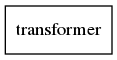

In [41]:
tf.keras.utils.plot_model(transformer, to_file='model_plot.png', show_shapes=True, show_layer_names=True)

# Training


## Learning Rate Schedule
As per Attention Is All You Need paper. We can use a simpler
schedule as used int he previous sections as well.


In [16]:
class CustomSchedule(tf.keras.optimizers.schedules.LearningRateSchedule):
    def __init__(self, d_model, warmup_steps=4000):
        super(CustomSchedule, self).__init__()

        self.d_model = d_model
        self.d_model = tf.cast(self.d_model, tf.float32)

        self.warmup_steps = warmup_steps

    def __call__(self, step):
        arg1 = tf.math.rsqrt(step)
        arg2 = step * (self.warmup_steps ** -1.5)

        return tf.math.rsqrt(self.d_model) * tf.math.minimum(arg1, arg2)

learning_rate = CustomSchedule(d_model)

optimizer = tf.keras.optimizers.Adam(learning_rate, beta_1=0.9, beta_2=0.98, 
                                     epsilon=1e-9)

Text(0.5, 0, 'Train Step')

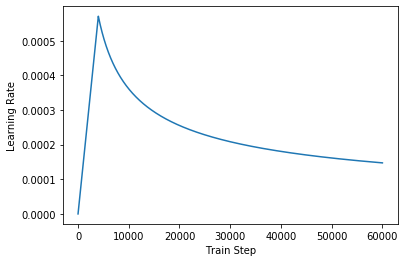

In [17]:
# Visualize the schedule
import matplotlib.pyplot as plt
temp_learning_rate_schedule = CustomSchedule(d_model)

plt.plot(temp_learning_rate_schedule(tf.range(60000, dtype=tf.float32)))
plt.ylabel("Learning Rate")
plt.xlabel("Train Step")

## Loss and Metrics

In [44]:
loss_object = tf.keras.losses.SparseCategoricalCrossentropy(
    from_logits=True, reduction='none')

def loss_function(real, pred):
    mask = tf.math.logical_not(tf.math.equal(real, 0))
    loss_ = loss_object(real, pred)

    mask = tf.cast(mask, dtype=loss_.dtype)
    loss_ *= mask
    
    return tf.reduce_sum(loss_)/tf.reduce_sum(mask)

In [45]:
train_loss = tf.keras.metrics.Mean(name='train_loss')
train_accuracy = tf.keras.metrics.SparseCategoricalAccuracy(
    name='train_accuracy')

## Setup Training

In [46]:
def create_masks(inp, tar):
    # Encoder padding mask - This should just be 1's
    # input shape should be (batch_size, 49, 2048)
    inp_seq = tf.ones([inp.shape[0], inp.shape[1]]) # all pixels to be used

    enc_padding_mask = create_padding_mask(inp_seq)
    
    # Used in the 2nd attention block in the decoder.
    # This padding mask is used to mask the encoder outputs.
    dec_padding_mask = create_padding_mask(inp_seq)
    
    # Used in the 1st attention block in the decoder.
    # It is used to pad and mask future tokens in the input received by 
    # the decoder.
    look_ahead_mask = create_look_ahead_mask(tf.shape(tar)[1])
    dec_target_padding_mask = create_padding_mask(tar)
    combined_mask = tf.maximum(dec_target_padding_mask, look_ahead_mask)
    
    return enc_padding_mask, combined_mask, dec_padding_mask

In [49]:
checkpoint_path = "./checkpoints/train-bert-base"

ckpt = tf.train.Checkpoint(transformer=transformer,
                           optimizer=optimizer)

ckpt_manager = tf.train.CheckpointManager(ckpt, checkpoint_path, max_to_keep=5)

# if a checkpoint exists, restore the latest checkpoint.
if ckpt_manager.latest_checkpoint:
    ckpt.restore(ckpt_manager.latest_checkpoint)
    print ('Latest checkpoint restored!!')

## Custom Training

In [53]:
@tf.function 
def train_step(inp, tar):
    tar_inp = tar[:, :-1]
    tar_real = tar[:, 1:]
    #print("train: output dimensions = ", tar_inp.shape) # ==(batch_size, 22-1)
    enc_padding_mask, combined_mask, dec_padding_mask = create_masks(inp, 
                                                                     tar_inp)
    
    with tf.GradientTape() as tape:
        predictions, _ = transformer(inp, tar_inp, 
                                 True, 
                                 enc_padding_mask, 
                                 combined_mask, 
                                 dec_padding_mask)
        loss = loss_function(tar_real, predictions)

    gradients = tape.gradient(loss, transformer.trainable_variables)    
    optimizer.apply_gradients(zip(gradients, transformer.trainable_variables))
    
    train_loss(loss)
    train_accuracy(tar_real, predictions)

In [51]:
EPOCHS=40
BUFFER_SIZE=1000
BATCH_SIZE=64
# Shuffle and batch
dataset = dataset.shuffle(BUFFER_SIZE).batch(BATCH_SIZE)
dataset = dataset.prefetch(buffer_size=tf.data.experimental.AUTOTUNE)

In [ ]:
for epoch in range(EPOCHS):
    start = time.time()
    
    train_loss.reset_states()
    train_accuracy.reset_states()
    
    # inp -> images, tar -> caption
    for (batch, (inp, tar)) in enumerate(dataset):
        train_step(inp, tar)
        
        if batch % 100 == 0:
            ts = datetime.datetime.now().strftime("%d-%b-%Y (%H:%M:%S)")
            print ('[{}] Epoch {} Batch {} Loss {:.4f} Accuracy {:.4f}'.format(
                ts, epoch + 1, batch, train_loss.result(), 
                train_accuracy.result()))
          
    if (epoch + 1) % 2 == 0:
        ckpt_save_path = ckpt_manager.save()
        print ('Saving checkpoint for epoch {} at {}'.format(epoch+1,
                                                             ckpt_save_path))
        
    print ('Epoch {} Loss {:.4f} Accuracy {:.4f}'.format(epoch + 1, 
                                                  train_loss.result(), 
                                                  train_accuracy.result()))

    print ('Time taken for 1 epoch: {} secs\n'.format(time.time() - start))

[20-Jul-2020 (19:43:21)] Epoch 1 Batch 0 Loss 8.9238 Accuracy 0.0000
[20-Jul-2020 (19:44:21)] Epoch 1 Batch 100 Loss 7.5133 Accuracy 0.0747
[20-Jul-2020 (19:45:21)] Epoch 1 Batch 200 Loss 6.9249 Accuracy 0.0777
[20-Jul-2020 (19:46:21)] Epoch 1 Batch 300 Loss 6.4399 Accuracy 0.0874
[20-Jul-2020 (19:47:22)] Epoch 1 Batch 400 Loss 6.1341 Accuracy 0.0942
[20-Jul-2020 (19:48:23)] Epoch 1 Batch 500 Loss 5.9181 Accuracy 0.0987
[20-Jul-2020 (19:49:25)] Epoch 1 Batch 600 Loss 5.7605 Accuracy 0.1019
[20-Jul-2020 (19:50:26)] Epoch 1 Batch 700 Loss 5.6364 Accuracy 0.1044
[20-Jul-2020 (19:51:28)] Epoch 1 Batch 800 Loss 5.5398 Accuracy 0.1062
[20-Jul-2020 (19:52:29)] Epoch 1 Batch 900 Loss 5.4584 Accuracy 0.1077
[20-Jul-2020 (19:53:31)] Epoch 1 Batch 1000 Loss 5.3905 Accuracy 0.1091
[20-Jul-2020 (19:54:33)] Epoch 1 Batch 1100 Loss 5.3366 Accuracy 0.1102
[20-Jul-2020 (19:55:35)] Epoch 1 Batch 1200 Loss 5.2931 Accuracy 0.1110
[20-Jul-2020 (19:56:37)] Epoch 1 Batch 1300 Loss 5.2567 Accuracy 0.1117
[20-

In [50]:
for epoch in range(EPOCHS):
    start = time.time()
    
    train_loss.reset_states()
    train_accuracy.reset_states()
    
    # inp -> images, tar -> caption
    for (batch, (inp, tar)) in enumerate(dataset):
        train_step(inp, tar)
        
        if batch % 100 == 0:
            ts = datetime.datetime.now().strftime("%d-%b-%Y (%H:%M:%S)")
            print ('[{}] Epoch {} Batch {} Loss {:.4f} Accuracy {:.4f}'.format(
                ts, epoch + 1, batch, train_loss.result(), 
                train_accuracy.result()))
          
    if (epoch + 1) % 2 == 0:
        ckpt_save_path = ckpt_manager.save()
        print ('Saving checkpoint for epoch {} at {}'.format(epoch+1,
                                                             ckpt_save_path))
        
    print ('Epoch {} Loss {:.4f} Accuracy {:.4f}'.format(epoch + 1, 
                                                  train_loss.result(), 
                                                  train_accuracy.result()))

    print ('Time taken for 1 epoch: {} secs\n'.format(time.time() - start))

[20-Jul-2020 (03:55:18)] Epoch 1 Batch 0 Loss 8.9822 Accuracy 0.0000
[20-Jul-2020 (03:55:26)] Epoch 1 Batch 100 Loss 8.7607 Accuracy 0.0510
[20-Jul-2020 (03:55:33)] Epoch 1 Batch 200 Loss 8.4468 Accuracy 0.0647
[20-Jul-2020 (03:55:40)] Epoch 1 Batch 300 Loss 8.0197 Accuracy 0.0819
[20-Jul-2020 (03:55:48)] Epoch 1 Batch 400 Loss 7.5482 Accuracy 0.0942
[20-Jul-2020 (03:55:55)] Epoch 1 Batch 500 Loss 7.1283 Accuracy 0.1049
[20-Jul-2020 (03:56:01)] Epoch 1 Batch 600 Loss 6.7715 Accuracy 0.1150
[20-Jul-2020 (03:56:08)] Epoch 1 Batch 700 Loss 6.4677 Accuracy 0.1243
[20-Jul-2020 (03:56:15)] Epoch 1 Batch 800 Loss 6.2093 Accuracy 0.1325
[20-Jul-2020 (03:56:21)] Epoch 1 Batch 900 Loss 5.9845 Accuracy 0.1400
[20-Jul-2020 (03:56:28)] Epoch 1 Batch 1000 Loss 5.7896 Accuracy 0.1465
[20-Jul-2020 (03:56:35)] Epoch 1 Batch 1100 Loss 5.6177 Accuracy 0.1523
[20-Jul-2020 (03:56:41)] Epoch 1 Batch 1200 Loss 5.4673 Accuracy 0.1576
[20-Jul-2020 (03:56:48)] Epoch 1 Batch 1300 Loss 5.3319 Accuracy 0.1625
[20-

[20-Jul-2020 (04:07:57)] Epoch 2 Batch 4800 Loss 2.7056 Accuracy 0.2797
[20-Jul-2020 (04:08:04)] Epoch 2 Batch 4900 Loss 2.7047 Accuracy 0.2798
[20-Jul-2020 (04:08:10)] Epoch 2 Batch 5000 Loss 2.7038 Accuracy 0.2799
[20-Jul-2020 (04:08:17)] Epoch 2 Batch 5100 Loss 2.7023 Accuracy 0.2800
[20-Jul-2020 (04:08:24)] Epoch 2 Batch 5200 Loss 2.7005 Accuracy 0.2801
[20-Jul-2020 (04:08:30)] Epoch 2 Batch 5300 Loss 2.6990 Accuracy 0.2802
[20-Jul-2020 (04:08:37)] Epoch 2 Batch 5400 Loss 2.6973 Accuracy 0.2803
[20-Jul-2020 (04:08:44)] Epoch 2 Batch 5500 Loss 2.6955 Accuracy 0.2804
[20-Jul-2020 (04:08:51)] Epoch 2 Batch 5600 Loss 2.6938 Accuracy 0.2805
[20-Jul-2020 (04:08:57)] Epoch 2 Batch 5700 Loss 2.6923 Accuracy 0.2806
[20-Jul-2020 (04:09:04)] Epoch 2 Batch 5800 Loss 2.6910 Accuracy 0.2807
[20-Jul-2020 (04:09:11)] Epoch 2 Batch 5900 Loss 2.6896 Accuracy 0.2808
[20-Jul-2020 (04:09:17)] Epoch 2 Batch 6000 Loss 2.6881 Accuracy 0.2809
[20-Jul-2020 (04:09:24)] Epoch 2 Batch 6100 Loss 2.6871 Accuracy

[20-Jul-2020 (04:20:49)] Epoch 4 Batch 2900 Loss 2.5170 Accuracy 0.2946
[20-Jul-2020 (04:20:56)] Epoch 4 Batch 3000 Loss 2.5166 Accuracy 0.2945
[20-Jul-2020 (04:21:03)] Epoch 4 Batch 3100 Loss 2.5160 Accuracy 0.2945
[20-Jul-2020 (04:21:10)] Epoch 4 Batch 3200 Loss 2.5153 Accuracy 0.2945
[20-Jul-2020 (04:21:17)] Epoch 4 Batch 3300 Loss 2.5151 Accuracy 0.2945
[20-Jul-2020 (04:21:24)] Epoch 4 Batch 3400 Loss 2.5140 Accuracy 0.2946
[20-Jul-2020 (04:21:31)] Epoch 4 Batch 3500 Loss 2.5136 Accuracy 0.2947
[20-Jul-2020 (04:21:38)] Epoch 4 Batch 3600 Loss 2.5133 Accuracy 0.2947
[20-Jul-2020 (04:21:45)] Epoch 4 Batch 3700 Loss 2.5126 Accuracy 0.2947
[20-Jul-2020 (04:21:52)] Epoch 4 Batch 3800 Loss 2.5124 Accuracy 0.2948
[20-Jul-2020 (04:23:10)] Epoch 4 Batch 4900 Loss 2.5088 Accuracy 0.2952
[20-Jul-2020 (04:23:17)] Epoch 4 Batch 5000 Loss 2.5087 Accuracy 0.2952
[20-Jul-2020 (04:23:24)] Epoch 4 Batch 5100 Loss 2.5083 Accuracy 0.2952
[20-Jul-2020 (04:23:31)] Epoch 4 Batch 5200 Loss 2.5075 Accuracy

[20-Jul-2020 (04:34:41)] Epoch 6 Batch 2000 Loss 2.4374 Accuracy 0.3010
[20-Jul-2020 (04:34:48)] Epoch 6 Batch 2100 Loss 2.4377 Accuracy 0.3010
[20-Jul-2020 (04:34:55)] Epoch 6 Batch 2200 Loss 2.4385 Accuracy 0.3010
[20-Jul-2020 (04:35:02)] Epoch 6 Batch 2300 Loss 2.4377 Accuracy 0.3011
[20-Jul-2020 (04:35:09)] Epoch 6 Batch 2400 Loss 2.4369 Accuracy 0.3012
[20-Jul-2020 (04:35:16)] Epoch 6 Batch 2500 Loss 2.4366 Accuracy 0.3012
[20-Jul-2020 (04:35:23)] Epoch 6 Batch 2600 Loss 2.4367 Accuracy 0.3011
[20-Jul-2020 (04:35:30)] Epoch 6 Batch 2700 Loss 2.4378 Accuracy 0.3011
[20-Jul-2020 (04:35:37)] Epoch 6 Batch 2800 Loss 2.4375 Accuracy 0.3011
[20-Jul-2020 (04:35:44)] Epoch 6 Batch 2900 Loss 2.4380 Accuracy 0.3011
[20-Jul-2020 (04:35:51)] Epoch 6 Batch 3000 Loss 2.4379 Accuracy 0.3010
[20-Jul-2020 (04:35:58)] Epoch 6 Batch 3100 Loss 2.4375 Accuracy 0.3010
[20-Jul-2020 (04:36:05)] Epoch 6 Batch 3200 Loss 2.4368 Accuracy 0.3010
[20-Jul-2020 (04:36:12)] Epoch 6 Batch 3300 Loss 2.4370 Accuracy

[20-Jul-2020 (04:47:25)] Epoch 8 Batch 100 Loss 2.3950 Accuracy 0.3051
[20-Jul-2020 (04:47:31)] Epoch 8 Batch 200 Loss 2.3894 Accuracy 0.3055
[20-Jul-2020 (04:47:38)] Epoch 8 Batch 300 Loss 2.3889 Accuracy 0.3051
[20-Jul-2020 (04:47:44)] Epoch 8 Batch 400 Loss 2.3905 Accuracy 0.3050
[20-Jul-2020 (04:47:51)] Epoch 8 Batch 500 Loss 2.3911 Accuracy 0.3049
[20-Jul-2020 (04:47:58)] Epoch 8 Batch 600 Loss 2.3919 Accuracy 0.3050
[20-Jul-2020 (04:48:04)] Epoch 8 Batch 700 Loss 2.3951 Accuracy 0.3049
[20-Jul-2020 (04:48:11)] Epoch 8 Batch 800 Loss 2.3955 Accuracy 0.3049
[20-Jul-2020 (04:48:17)] Epoch 8 Batch 900 Loss 2.3924 Accuracy 0.3051
[20-Jul-2020 (04:48:24)] Epoch 8 Batch 1000 Loss 2.3920 Accuracy 0.3050
[20-Jul-2020 (04:48:30)] Epoch 8 Batch 1100 Loss 2.3913 Accuracy 0.3049
[20-Jul-2020 (04:48:37)] Epoch 8 Batch 1200 Loss 2.3921 Accuracy 0.3050
[20-Jul-2020 (04:48:43)] Epoch 8 Batch 1300 Loss 2.3924 Accuracy 0.3051
[20-Jul-2020 (04:48:50)] Epoch 8 Batch 1400 Loss 2.3940 Accuracy 0.3049
[

[20-Jul-2020 (04:59:44)] Epoch 9 Batch 4900 Loss 2.3732 Accuracy 0.3067
[20-Jul-2020 (04:59:51)] Epoch 9 Batch 5000 Loss 2.3734 Accuracy 0.3067
[20-Jul-2020 (04:59:57)] Epoch 9 Batch 5100 Loss 2.3732 Accuracy 0.3067
[20-Jul-2020 (05:00:04)] Epoch 9 Batch 5200 Loss 2.3730 Accuracy 0.3068
[20-Jul-2020 (05:00:10)] Epoch 9 Batch 5300 Loss 2.3724 Accuracy 0.3068
[20-Jul-2020 (05:00:17)] Epoch 9 Batch 5400 Loss 2.3719 Accuracy 0.3068
[20-Jul-2020 (05:00:23)] Epoch 9 Batch 5500 Loss 2.3714 Accuracy 0.3068
[20-Jul-2020 (05:00:30)] Epoch 9 Batch 5600 Loss 2.3712 Accuracy 0.3068
[20-Jul-2020 (05:00:36)] Epoch 9 Batch 5700 Loss 2.3707 Accuracy 0.3068
[20-Jul-2020 (05:00:43)] Epoch 9 Batch 5800 Loss 2.3705 Accuracy 0.3068
[20-Jul-2020 (05:00:49)] Epoch 9 Batch 5900 Loss 2.3703 Accuracy 0.3068
[20-Jul-2020 (05:00:56)] Epoch 9 Batch 6000 Loss 2.3699 Accuracy 0.3069
[20-Jul-2020 (05:01:03)] Epoch 9 Batch 6100 Loss 2.3701 Accuracy 0.3069
[20-Jul-2020 (05:01:09)] Epoch 9 Batch 6200 Loss 2.3703 Accuracy

[20-Jul-2020 (05:14:23)] Epoch 11 Batch 4600 Loss 2.3455 Accuracy 0.3090
[20-Jul-2020 (05:14:30)] Epoch 11 Batch 4700 Loss 2.3451 Accuracy 0.3090
[20-Jul-2020 (05:14:37)] Epoch 11 Batch 4800 Loss 2.3450 Accuracy 0.3090
[20-Jul-2020 (05:14:44)] Epoch 11 Batch 4900 Loss 2.3453 Accuracy 0.3090
[20-Jul-2020 (05:14:51)] Epoch 11 Batch 5000 Loss 2.3456 Accuracy 0.3090
[20-Jul-2020 (05:14:58)] Epoch 11 Batch 5100 Loss 2.3455 Accuracy 0.3090
[20-Jul-2020 (05:15:05)] Epoch 11 Batch 5200 Loss 2.3450 Accuracy 0.3090
[20-Jul-2020 (05:15:12)] Epoch 11 Batch 5300 Loss 2.3447 Accuracy 0.3091
[20-Jul-2020 (05:15:19)] Epoch 11 Batch 5400 Loss 2.3442 Accuracy 0.3090
[20-Jul-2020 (05:15:27)] Epoch 11 Batch 5500 Loss 2.3436 Accuracy 0.3091
[20-Jul-2020 (05:15:34)] Epoch 11 Batch 5600 Loss 2.3436 Accuracy 0.3091
[20-Jul-2020 (05:15:41)] Epoch 11 Batch 5700 Loss 2.3431 Accuracy 0.3091
[20-Jul-2020 (05:15:48)] Epoch 11 Batch 5800 Loss 2.3430 Accuracy 0.3091
[20-Jul-2020 (05:15:55)] Epoch 11 Batch 5900 Loss 2

[20-Jul-2020 (05:27:06)] Epoch 13 Batch 2600 Loss 2.3246 Accuracy 0.3109
[20-Jul-2020 (05:27:13)] Epoch 13 Batch 2700 Loss 2.3253 Accuracy 0.3108
[20-Jul-2020 (05:27:20)] Epoch 13 Batch 2800 Loss 2.3253 Accuracy 0.3108
[20-Jul-2020 (05:27:27)] Epoch 13 Batch 2900 Loss 2.3258 Accuracy 0.3108
[20-Jul-2020 (05:27:34)] Epoch 13 Batch 3000 Loss 2.3259 Accuracy 0.3107
[20-Jul-2020 (05:27:41)] Epoch 13 Batch 3100 Loss 2.3257 Accuracy 0.3106
[20-Jul-2020 (05:27:48)] Epoch 13 Batch 3200 Loss 2.3251 Accuracy 0.3107
[20-Jul-2020 (05:27:55)] Epoch 13 Batch 3300 Loss 2.3254 Accuracy 0.3107
[20-Jul-2020 (05:28:02)] Epoch 13 Batch 3400 Loss 2.3246 Accuracy 0.3107
[20-Jul-2020 (05:28:09)] Epoch 13 Batch 3500 Loss 2.3246 Accuracy 0.3107
[20-Jul-2020 (05:28:16)] Epoch 13 Batch 3600 Loss 2.3242 Accuracy 0.3107
[20-Jul-2020 (05:28:23)] Epoch 13 Batch 3700 Loss 2.3244 Accuracy 0.3107
[20-Jul-2020 (05:28:30)] Epoch 13 Batch 3800 Loss 2.3243 Accuracy 0.3107
[20-Jul-2020 (05:28:37)] Epoch 13 Batch 3900 Loss 2

[20-Jul-2020 (05:39:54)] Epoch 15 Batch 600 Loss 2.3066 Accuracy 0.3121
[20-Jul-2020 (05:40:00)] Epoch 15 Batch 700 Loss 2.3094 Accuracy 0.3122
[20-Jul-2020 (05:40:07)] Epoch 15 Batch 800 Loss 2.3105 Accuracy 0.3122
[20-Jul-2020 (05:40:13)] Epoch 15 Batch 900 Loss 2.3075 Accuracy 0.3123
[20-Jul-2020 (05:40:20)] Epoch 15 Batch 1000 Loss 2.3066 Accuracy 0.3124
[20-Jul-2020 (05:40:26)] Epoch 15 Batch 1100 Loss 2.3056 Accuracy 0.3124
[20-Jul-2020 (05:40:33)] Epoch 15 Batch 1200 Loss 2.3063 Accuracy 0.3123
[20-Jul-2020 (05:40:40)] Epoch 15 Batch 1300 Loss 2.3069 Accuracy 0.3124
[20-Jul-2020 (05:40:46)] Epoch 15 Batch 1400 Loss 2.3078 Accuracy 0.3124
[20-Jul-2020 (05:40:53)] Epoch 15 Batch 1500 Loss 2.3075 Accuracy 0.3124
[20-Jul-2020 (05:40:59)] Epoch 15 Batch 1600 Loss 2.3067 Accuracy 0.3124
[20-Jul-2020 (05:41:06)] Epoch 15 Batch 1700 Loss 2.3057 Accuracy 0.3124
[20-Jul-2020 (05:41:12)] Epoch 15 Batch 1800 Loss 2.3054 Accuracy 0.3125
[20-Jul-2020 (05:41:19)] Epoch 15 Batch 1900 Loss 2.306

[20-Jul-2020 (05:52:29)] Epoch 16 Batch 5300 Loss 2.2977 Accuracy 0.3132
[20-Jul-2020 (05:52:36)] Epoch 16 Batch 5400 Loss 2.2972 Accuracy 0.3132
[20-Jul-2020 (05:52:43)] Epoch 16 Batch 5500 Loss 2.2968 Accuracy 0.3133
[20-Jul-2020 (05:52:50)] Epoch 16 Batch 5600 Loss 2.2965 Accuracy 0.3133
[20-Jul-2020 (05:52:57)] Epoch 16 Batch 5700 Loss 2.2963 Accuracy 0.3133
[20-Jul-2020 (05:53:04)] Epoch 16 Batch 5800 Loss 2.2961 Accuracy 0.3133
[20-Jul-2020 (05:53:11)] Epoch 16 Batch 5900 Loss 2.2960 Accuracy 0.3133
[20-Jul-2020 (05:53:18)] Epoch 16 Batch 6000 Loss 2.2956 Accuracy 0.3133
[20-Jul-2020 (05:53:25)] Epoch 16 Batch 6100 Loss 2.2958 Accuracy 0.3133
[20-Jul-2020 (05:53:32)] Epoch 16 Batch 6200 Loss 2.2961 Accuracy 0.3133
[20-Jul-2020 (05:53:39)] Epoch 16 Batch 6300 Loss 2.2963 Accuracy 0.3133
[20-Jul-2020 (05:53:46)] Epoch 16 Batch 6400 Loss 2.2965 Accuracy 0.3133
Saving checkpoint for epoch 16 at ./checkpoints/train/ckpt-8
Epoch 16 Loss 2.2963 Accuracy 0.3133
Time taken for 1 epoch: 45

[20-Jul-2020 (06:04:46)] Epoch 18 Batch 3300 Loss 2.2854 Accuracy 0.3144
[20-Jul-2020 (06:04:53)] Epoch 18 Batch 3400 Loss 2.2847 Accuracy 0.3144
[20-Jul-2020 (06:05:00)] Epoch 18 Batch 3500 Loss 2.2850 Accuracy 0.3144
[20-Jul-2020 (06:05:07)] Epoch 18 Batch 3600 Loss 2.2849 Accuracy 0.3144
[20-Jul-2020 (06:05:14)] Epoch 18 Batch 3700 Loss 2.2847 Accuracy 0.3144
[20-Jul-2020 (06:05:22)] Epoch 18 Batch 3800 Loss 2.2848 Accuracy 0.3144
[20-Jul-2020 (06:05:29)] Epoch 18 Batch 3900 Loss 2.2845 Accuracy 0.3144
[20-Jul-2020 (06:05:36)] Epoch 18 Batch 4000 Loss 2.2849 Accuracy 0.3144
[20-Jul-2020 (06:05:43)] Epoch 18 Batch 4100 Loss 2.2852 Accuracy 0.3144
[20-Jul-2020 (06:05:50)] Epoch 18 Batch 4200 Loss 2.2850 Accuracy 0.3144
[20-Jul-2020 (06:05:57)] Epoch 18 Batch 4300 Loss 2.2852 Accuracy 0.3144
[20-Jul-2020 (06:06:04)] Epoch 18 Batch 4400 Loss 2.2853 Accuracy 0.3144
[20-Jul-2020 (06:06:11)] Epoch 18 Batch 4500 Loss 2.2849 Accuracy 0.3145
[20-Jul-2020 (06:06:18)] Epoch 18 Batch 4600 Loss 2

[20-Jul-2020 (06:17:25)] Epoch 20 Batch 1300 Loss 2.2724 Accuracy 0.3157
[20-Jul-2020 (06:17:32)] Epoch 20 Batch 1400 Loss 2.2744 Accuracy 0.3155
[20-Jul-2020 (06:17:38)] Epoch 20 Batch 1500 Loss 2.2738 Accuracy 0.3155
[20-Jul-2020 (06:17:45)] Epoch 20 Batch 1600 Loss 2.2732 Accuracy 0.3156
[20-Jul-2020 (06:17:51)] Epoch 20 Batch 1700 Loss 2.2721 Accuracy 0.3156
[20-Jul-2020 (06:17:58)] Epoch 20 Batch 1800 Loss 2.2716 Accuracy 0.3157
[20-Jul-2020 (06:18:04)] Epoch 20 Batch 1900 Loss 2.2723 Accuracy 0.3157
[20-Jul-2020 (06:18:11)] Epoch 20 Batch 2000 Loss 2.2721 Accuracy 0.3156
[20-Jul-2020 (06:18:18)] Epoch 20 Batch 2100 Loss 2.2723 Accuracy 0.3157
[20-Jul-2020 (06:18:24)] Epoch 20 Batch 2200 Loss 2.2729 Accuracy 0.3156
[20-Jul-2020 (06:18:31)] Epoch 20 Batch 2300 Loss 2.2724 Accuracy 0.3157
[20-Jul-2020 (06:18:37)] Epoch 20 Batch 2400 Loss 2.2722 Accuracy 0.3158
[20-Jul-2020 (06:18:44)] Epoch 20 Batch 2500 Loss 2.2715 Accuracy 0.3158
[20-Jul-2020 (06:18:50)] Epoch 20 Batch 2600 Loss 2

In [51]:
transformer.summary()

Model: "transformer"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
visual_encoder (VisualEncode multiple                  1055360   
_________________________________________________________________
decoder (Decoder)            multiple                  2113920   
_________________________________________________________________
dense_65 (Dense)             multiple                  1063863   
Total params: 4,233,143
Trainable params: 4,233,143
Non-trainable params: 0
_________________________________________________________________


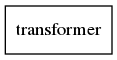

In [52]:
tf.keras.utils.plot_model(transformer, to_file='model_plot.png', show_shapes=True, show_layer_names=True)

# Inference  - Generate Caption

In [78]:
def evaluate(inp_img, max_len=21):
    start_token = cap_tokenizer.encode("<s>")[0]
    end_token = cap_tokenizer.encode("</s>")[0]
    
    encoder_input = inp_img #tf.expand_dims(inp_img, 0) # batch of 1
    #print("Dimensions of input: ", encoder_input.shape)
    # start token for caption
    decoder_input = [start_token]
    #print("eval: decoder_input dimensions = ", decoder_input.shape) # ==(1,)
    output = tf.expand_dims(decoder_input, 0)
    #print("eval: output dimensions = ", output.shape) # ==(1, 1)
    for i in range(max_len):
        enc_padding_mask, combined_mask, dec_padding_mask = create_masks(
            encoder_input, output)
        #print(enc_padding_mask.shape, combined_mask.shape, dec_padding_mask.shape)
        #print(enc_padding_mask, combined_mask, dec_padding_mask)
        
        # predictions.shape == (batch_size, seq_len, vocab_size)
        predictions, attention_weights = transformer(encoder_input, 
                                                     output,
                                                     False, # not training
                                                     enc_padding_mask,
                                                     combined_mask,
                                                     dec_padding_mask)
        
        # select the last word from the seq_len dimension
        predictions = predictions[: ,-1:, :]  # (batch_size, 1, vocab_size)

        predicted_id = tf.cast(tf.argmax(predictions, axis=-1), tf.int32)
        
        # return the result if the predicted_id is equal to the end token
        if predicted_id == end_token:
            return tf.squeeze(output, axis=0), attention_weights
        
        # concatentate the predicted_id to the output which is given to the decoder
        # as its input.
        output = tf.concat([output, predicted_id], axis=-1)

    return tf.squeeze(output, axis=0), attention_weights

In [72]:
def caption(image, plot=''):
    end_token = cap_tokenizer.encode("</s>")[0]
    result, attention_weights = evaluate(image)
    
    predicted_sentence = cap_tokenizer.decode([i for i in result 
                                              if i > end_token])  

    #print('Input: {}'.format(sentence))
    print('Predicted translation: {}'.format(predicted_sentence))
    
    if plot:
        plot_attention_weights(attention_weights, sentence, result, plot)

In [54]:
rs50 = tf.keras.applications.ResNet50(
    include_top=False,
    weights="imagenet",  #no pooling
    input_shape=(224, 224, 3)
)

In [55]:
new_input = rs50.input
hidden_layer = rs50.layers[-1].output

features_extract = tf.keras.Model(new_input, hidden_layer)
features_extract.summary()

Model: "model"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, 224, 224, 3) 0                                            
__________________________________________________________________________________________________
conv1_pad (ZeroPadding2D)       (None, 230, 230, 3)  0           input_1[0][0]                    
__________________________________________________________________________________________________
conv1_conv (Conv2D)             (None, 112, 112, 64) 9472        conv1_pad[0][0]                  
__________________________________________________________________________________________________
conv1_bn (BatchNormalization)   (None, 112, 112, 64) 256         conv1_conv[0][0]                 
______________________________________________________________________________________________

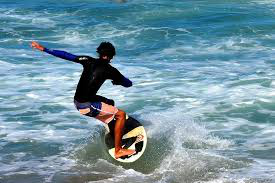

In [56]:
display(Image.open("./beach-surf.jpg"))

In [57]:
image = load_img("./beach-surf.jpg", target_size=(224, 224)) # from keras
image = img_to_array(image)
image = np.expand_dims(image, axis=0)  # batch of one
image = preprocess_input(image)  # from resnet

In [58]:
eval_img = features_extract.predict(image)
print(eval_img.shape)
eval_img = tf.reshape(eval_img, [1, 49, 2048])
print(eval_img.shape)

(1, 7, 7, 2048)
(1, 49, 2048)


In [79]:
caption(eval_img)

Predicted translation: a man riding a surfboard on top of a wave.


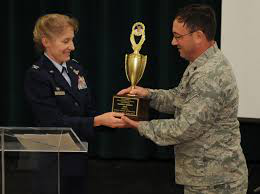

(1, 7, 7, 2048)
(1, 49, 2048)
Predicted translation: a man and a woman standing next to each other holding a glass of wine.


In [81]:
display(Image.open("./tropy-military.jpeg"))
image = load_img("./tropy-military.jpeg", target_size=(224, 224)) # from keras
image = img_to_array(image)
image = np.expand_dims(image, axis=0)  # batch of one
image = preprocess_input(image)  # from resnet
eval_img = features_extract.predict(image)
print(eval_img.shape)
eval_img = tf.reshape(eval_img, [1, 49, 2048])
print(eval_img.shape)
caption(eval_img)

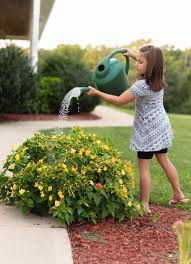

(1, 7, 7, 2048)
(1, 49, 2048)
Predicted translation: a woman in a dress holding a tennis racquet.


In [82]:
display(Image.open("./girl-watering.jpeg"))
image = load_img("./girl-watering.jpeg", target_size=(224, 224)) # from keras
image = img_to_array(image)
image = np.expand_dims(image, axis=0)  # batch of one
image = preprocess_input(image)  # from resnet
eval_img = features_extract.predict(image)
print(eval_img.shape)
eval_img = tf.reshape(eval_img, [1, 49, 2048])
print(eval_img.shape)
caption(eval_img)

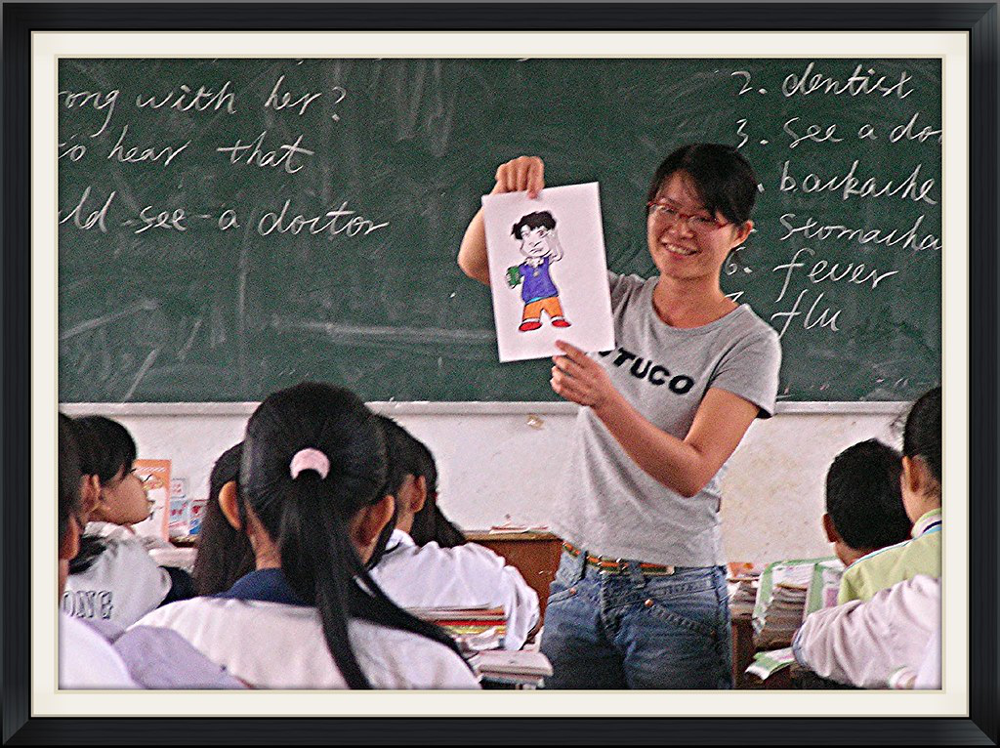

(1, 7, 7, 2048)
(1, 49, 2048)
Predicted translation: a man and a woman playing a game of baseball.


In [83]:
display(Image.open("./teacher-class.jpg"))
image = load_img("./teacher-class.jpg", target_size=(224, 224)) # from keras
image = img_to_array(image)
image = np.expand_dims(image, axis=0)  # batch of one
image = preprocess_input(image)  # from resnet
eval_img = features_extract.predict(image)
print(eval_img.shape)
eval_img = tf.reshape(eval_img, [1, 49, 2048])
print(eval_img.shape)
caption(eval_img)

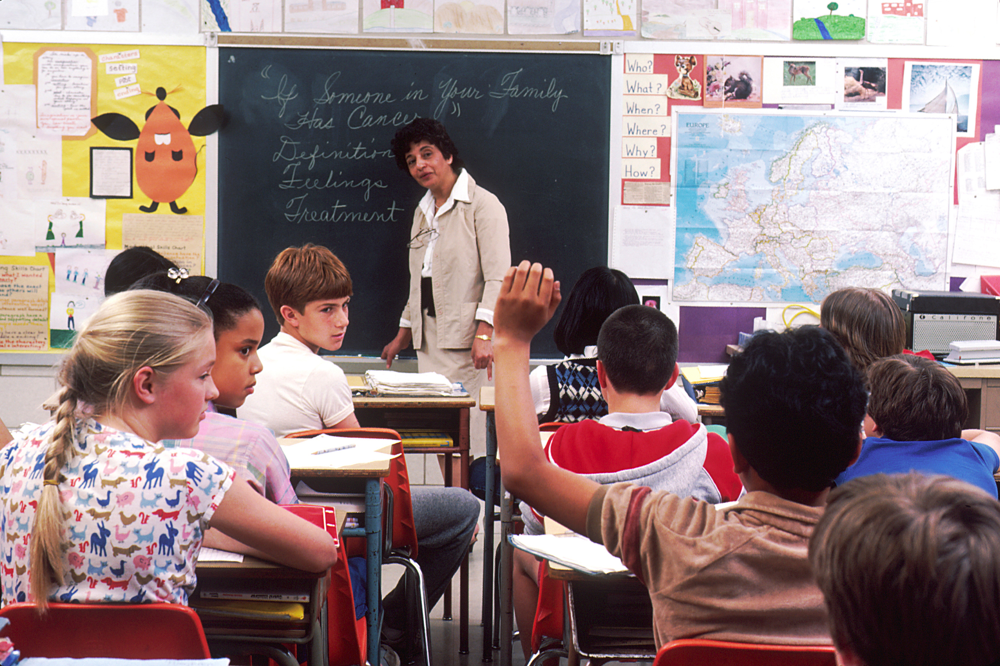

(1, 7, 7, 2048)
(1, 49, 2048)
Predicted translation: a group of people standing around a table with a cake.


In [84]:
display(Image.open("./Children_in_a_classroom.jpg"))
image = load_img("./Children_in_a_classroom.jpg", target_size=(224, 224)) # from keras
image = img_to_array(image)
image = np.expand_dims(image, axis=0)  # batch of one
image = preprocess_input(image)  # from resnet
eval_img = features_extract.predict(image)
print(eval_img.shape)
eval_img = tf.reshape(eval_img, [1, 49, 2048])
print(eval_img.shape)
caption(eval_img)

In [1]:
display(Image.open("./chap7-tulip.jpg"))
image = load_img("./chap7-tulip.jpg", target_size=(224, 224)) # from keras
image = img_to_array(image)
image = np.expand_dims(image, axis=0)  # batch of one
image = preprocess_input(image)  # from resnet
eval_img = features_extract.predict(image)
print(eval_img.shape)
eval_img = tf.reshape(eval_img, [1, 49, 2048])
print(eval_img.shape)
caption(eval_img)

NameError: name 'Image' is not defined

In [65]:
decoder_input = [1000]
output = tf.expand_dims(decoder_input, 0)
output

<tf.Tensor: shape=(1, 1), dtype=int32, numpy=array([[1000]], dtype=int32)>

In [66]:
cap_tokenizer.encode("<s>")

[1]

In [154]:
for (batch, (inp, tar)) in enumerate(dataset):
        print(batch)
        print(inp.shape)
        print(tar.shape)
        break

0
(32, 49, 2048)
(32, 22)


In [53]:
cap_tokenizer.encode(end)

[2]